In [1]:
import sys
sys.path.append('/home/l_bechir/github/aare/build')

In [2]:
from _aare import *
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import mpld3
mpld3.enable_notebook()

In [3]:
import _aare
dir(_aare)

['Auto',
 'ChipTestBoard',
 'Cluster',
 'ClusterFileV2',
 'ClusterFinder',
 'ClusterHeader',
 'ClusterV2',
 'ClusterV2_',
 'DOUBLE',
 'DetectorType',
 'Dtype',
 'DtypeIndex',
 'ERROR',
 'Eiger',
 'FLOAT',
 'File',
 'FileConfig',
 'Frame',
 'INT16',
 'INT32',
 'INT64',
 'INT8',
 'Jungfrau',
 'Moench',
 'Mythen3',
 'NDArray_<i1_2',
 'NDArray_<i2_2',
 'NDArray_<i4_2',
 'NDArray_<i8_2',
 'NDArray_<u1_2',
 'NDArray_<u2_2',
 'NDArray_<u4_2',
 'NDArray_<u8_2',
 'NDArray_f4_2',
 'NDArray_f8_2',
 'NDView_<i1_2',
 'NDView_<i2_2',
 'NDView_<i4_2',
 'NDView_<i8_2',
 'NDView_<u1_2',
 'NDView_<u2_2',
 'NDView_<u4_2',
 'NDView_<u8_2',
 'NDView_f4_2',
 'NDView_f8_2',
 'Path',
 'Pedestal',
 'TimingMode',
 'Transforms',
 'Trigger',
 'UINT16',
 'UINT32',
 'UINT64',
 'UINT8',
 'Unknown',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'big',
 'endian',
 'little',
 'native',
 'sls_detector_header',
 'to_frame',
 'xy']

In [4]:
!pwd

/home/l_bechir/github/aare/src/python/example


In [5]:
file = File("../../../data/jungfrau/jungfrau_single_master_0.json")
file.rows,file.cols,file.bitdepth,file.detector_type

(512, 1024, 16, <DetectorType.Jungfrau: 0>)

In [6]:
frame = file.read()
frame.rows,frame.cols,frame.bitdepth

(512, 1024, 16)

In [7]:
np.array(frame)

array([[2123, 2852, 2821, ..., 3007, 3039, 2677],
       [2691, 3291, 3284, ..., 3246, 3189, 2960],
       [3062, 3222, 3080, ..., 3016, 3198, 2942],
       ...,
       [2679, 3041, 2709, ..., 3399, 3190, 3068],
       [2985, 3063, 2908, ..., 3211, 3231, 3137],
       [2326, 2480, 2893, ..., 2925, 3354, 3252]], dtype=uint16)

In [8]:
# plt.imshow(np.array(frame))
# plt.show()

In [9]:
file = File("/mnt/sls_det_storage/moench_data/testNewFW20230714/cu_half_speed_master_4.json")
file.rows,file.cols,file.detector_type

(400, 400, <DetectorType.Moench: 3>)

400


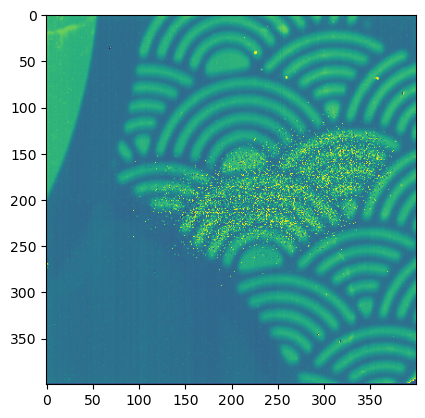

In [31]:
arr =file.read()
print(arr.rows)
transforms = Transforms()
transforms.add(Transforms.reorder_moench())
# transforms(arr)
plt.imshow(arr)

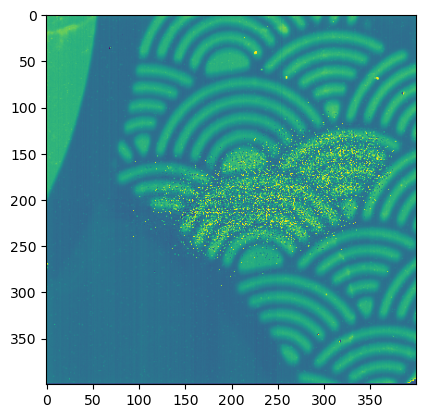

In [11]:
frame = file.read()
nparray = np.array(frame)
plt.imshow(nparray)
plt.show()

In [12]:
cluster_file = ClusterFileV2("/mnt/sls_det_storage/moench_data/testNewFW20230714/clust/cu_half_speed_d0_f0_4.clust",'r')
cluster_file.frame_number()

23389

In [13]:
cluster_file.frame_number()

23389

In [14]:
pedestal = Pedestal(file.rows,file.cols)

In [15]:
for i in range(1000):
    frame = file.iread(i)
    pedestal.push(frame)
    

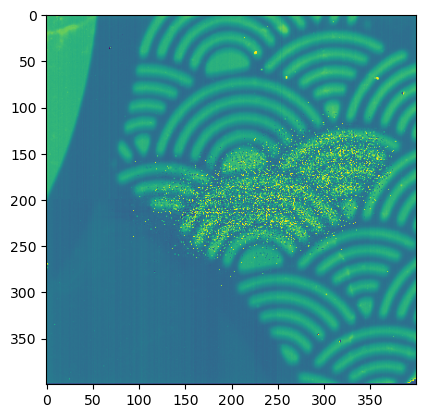

In [16]:
ndarray = pedestal.mean()
plt.imshow(np.array(ndarray))
plt.show()

In [17]:
pedestal.mean()[0,0], np.array(file.iread(0))[0,0]

(4407.045, 4488)

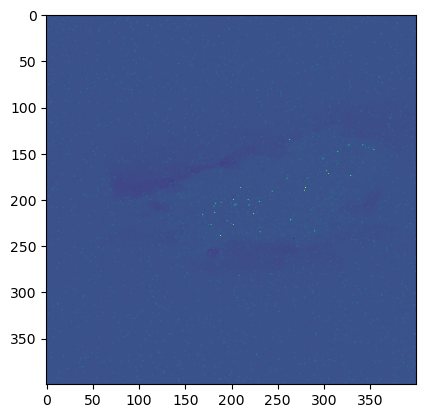

In [18]:
denoised_array = np.array(file.iread(0))-np.array(pedestal.mean())
plt.imshow(denoised_array)
plt.show()

In [19]:
#find frame with frame_number 23389
frame=None
for i in range(file.total_frames):
    fn = file.frame_number(i)
    if(fn==cluster_file.frame_number()):
        frame=file.iread(i)
        break
i,file.frame_number(i),np.array(frame)        
    


(1012,
 23389,
 array([[ 4421,  4267,  4534, ...,  4257,  4277,  4427],
        [11941, 11688, 11716, ...,  7054,  7370,  7448],
        [11738, 11381, 11393, ...,  6787,  7152,  7092],
        ...,
        [ 7265,  7007,  6977, ...,  4084,  4180,  4305],
        [ 7188,  7334,  6944, ...,  4084,  4346,  4266],
        [ 4157,  4290,  4343, ...,  4248,  4366,  4462]], dtype=uint16))

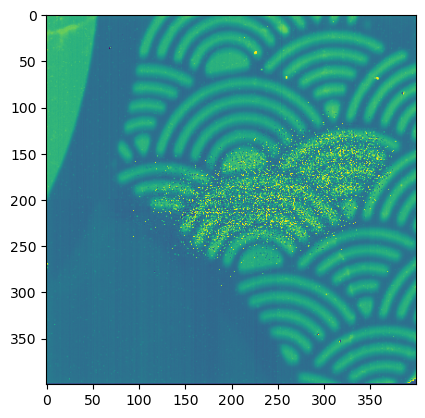

In [20]:
plt.imshow(np.array(frame))

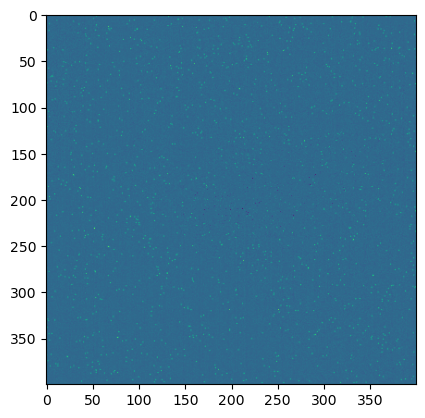

In [21]:
plt.imshow(np.array(frame)-pedestal.mean())

In [22]:
cluster_finder = ClusterFinder(3,3,5.0,0)
clusters = cluster_finder.find_clusters_without_threshold(np.array(frame),pedestal,True)
len(clusters)

1235

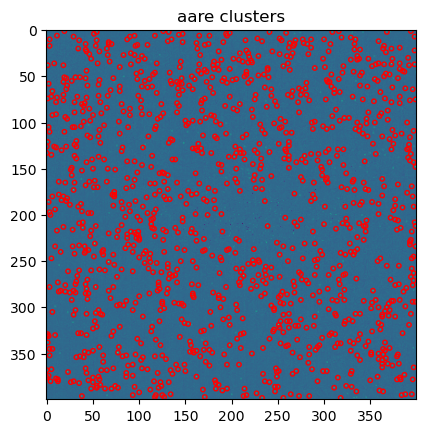

In [23]:
cluster_x = [cluster.x for cluster in clusters]
cluster_y = [cluster.y for cluster in clusters]
plt.imshow(np.array(frame)-pedestal.mean())
plt.scatter(cluster_x,cluster_y, s=10, facecolors='none', edgecolors='r')
plt.title("aare clusters")
plt.show()

In [24]:
anna_clusters=cluster_file.read()
len(anna_clusters)

305

In [25]:
clusters[0]

<Cluster: x: 19, y: 1>

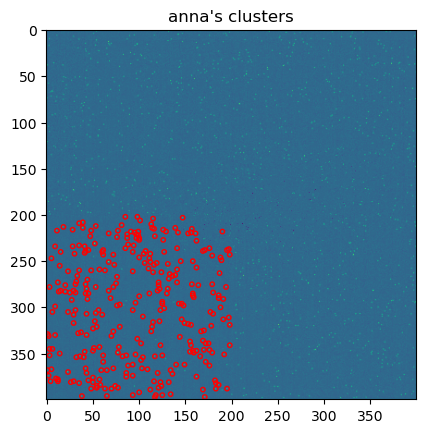

In [26]:
cluster_x = [cluster.cluster.x for cluster in anna_clusters]
cluster_y = [cluster.cluster.y for cluster in anna_clusters]

plt.imshow(np.array(frame)-pedestal.mean())
plt.scatter(cluster_x,cluster_y, s=10, facecolors='none', edgecolors='r')
plt.title("anna's clusters")
plt.show()

In [27]:
np.array(frame)

array([[ 4421,  4267,  4534, ...,  4257,  4277,  4427],
       [11941, 11688, 11716, ...,  7054,  7370,  7448],
       [11738, 11381, 11393, ...,  6787,  7152,  7092],
       ...,
       [ 7265,  7007,  6977, ...,  4084,  4180,  4305],
       [ 7188,  7334,  6944, ...,  4084,  4346,  4266],
       [ 4157,  4290,  4343, ...,  4248,  4366,  4462]], dtype=uint16)

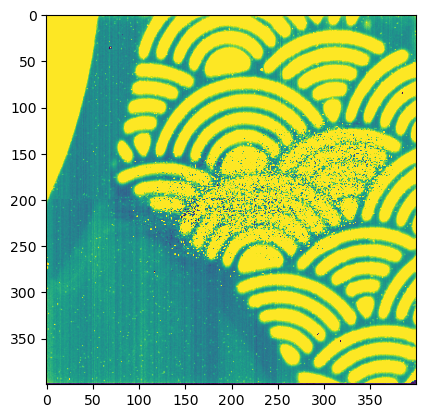

In [28]:
frame = file.iread(0)
plt.imshow(np.array(frame))
plt.clim(4000,8000)
plt.show()

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,
         0.,  0.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,
         1.,  0.,  0.,  0.,  1.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,
         0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  3.,  1.,  0.,  1.,
         0.,  0.,  0.,  1.,  0.,  0.,  1.,  2.,  1.,  1.,  2.,  3.,  1.,
         1.,  0.,  2.,  0.,  0.,  0.,  2.,  0.,  3.,  0.,  3.,  1.,  1.,
         1.,  1.,  2.,  1.,  3.,  0.,  1.,  4.,  4.,  2.,  1.,  2.,  1.,
         3.,  4.,  2.,  3.,  4.,  4.,  2.,  1.,  2.,  3.,  4.,  2.,  4.,
         2.,  4.,  5.,  3., 11.,  6., 11.,  8.,  8.,  6.,  7.,  7.,  5.,
         8.,  6.,  7., 10., 11.,  9.,  8., 10.,  8.,  8., 12., 11., 12.,
        16., 15.,  9., 10., 13., 13., 10., 10., 17.

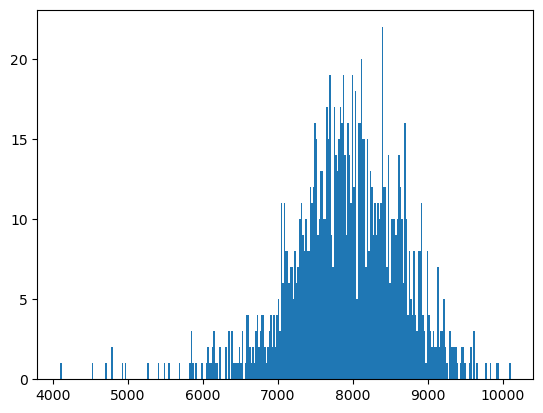

In [29]:
arr=[]
for c in clusters:
    arr.append(np.array(c.data(),np.double).sum())
plt.hist(arr,bins=300)